# Earth Lab Spectral tools vignette

In [40]:
import hytools as ht
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random

## Load Earth Lab Spectral tools

In [43]:
%load_ext autoreload
%autoreload 2
import spectral_unmixing_tools as el_spectral

print(dir(el_spectral))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
['GradientBoostingRegressor', '__builtins__', '__cached__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'boosted_quantile_plot', 'boosted_quantile_plot_by_sensor', 'box', 'concatenate_sensors', 'download_neon_file', 'extract_overlapping_layers_to_2d_dataframe', 'fit_models_with_different_alpha', 'generate_configurations', 'generate_correction_configs', 'get_spectral_data_and_wavelengths', 'glob', 'gpd', 'h5py', 'ht', 'json', 'load_spectra', 'mask', 'np', 'os', 'pd', 'plot_each_sensor_with_highlight', 'plot_spectral_data', 'plot_with_highlighted_sensors', 'plt', 'prepare_spectral_data', 'process_hdf5_with_neon2envi', 'random', 'rasterio', 'rasterize', 'rasterize_polygons_to_match_envi', 'requests', 'reshape_spectra', 'run_bash_script_in_conda_env', 'show', 'show_rgb', 'subprocess']


## Get flightline from NEON

In [7]:
site_code = 'NIWO'
product_code = 'DP1.30006.001'
year_month = '2020-08'  # The specific month of interest
flight_line = 'D13_NIWO_DP1_20200801_161441'  # The exact flight line identifier

el_spectral.download_neon_file(site_code, product_code, year_month, flight_line)

Data retrieved successfully for 2020-08!


--2024-03-19 18:15:14--  https://storage.googleapis.com/neon-aop-products/2020/FullSite/D13/2020_NIWO_4/L1/Spectrometer/ReflectanceH5/2020080114/NEON_D13_NIWO_DP1_20200801_161441_reflectance.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.68.123, 142.250.188.251, 172.217.12.155, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.68.123|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 4068977853 (3.8G) [application/octet-stream]
Saving to: ‘NEON_D13_NIWO_DP1_20200801_161441_reflectance.h5’

     0K .......... .......... .......... .......... ..........  0%  582K 1h53m
    50K .......... .......... .......... .......... ..........  0%  816K 97m26s
   100K .......... .......... .......... .......... ..........  0% 1.98M 75m52s
   150K .......... .......... .......... .......... ..........  0% 2.19M 64m17s
   200K .......... .......... .......... .......... .......... 

## Convert the .h5 file to ENVI file

In [ ]:
conda_env_path = "/opt/conda/envs/macrosystems"
bash_script = "correct.sh"
h5_file = "NEON_D13_NIWO_DP1_20200801_161441_reflectance.h5"
el_spectral.sprectral_unmixing_tools.run_bash_script_in_conda_env(conda_env_path, bash_script, [h5_file], use_ancillary=True)

## Plot fresh ENVI file for quality check

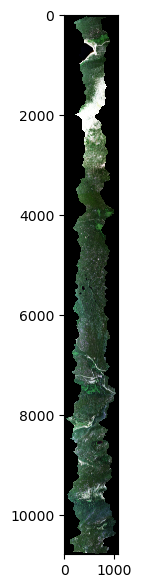

In [26]:
og_envi = ht.HyTools()
og_envi.read_file("output/NEON_D13_NIWO_DP1_20200801_161441_reflectance",'envi')
el_spectral.show_rgb(og_envi, correct= [])

## Apply corrections to flightline

### Build configuration file for corrections
This will save a json file to the flight line directory with all of the meta data and configurations necessary to caluclate the corrections in the next step. 

In [13]:
main_image_file = "NEON_D13_NIWO_DP1_20200801_161441_reflectance.h5"  # Update with your main image file path
output_dir = 'output'  # Update with your desired output directory
el_spectral.generate_correction_configs(main_image_file, output_dir)

Configuration saved to output/NEON_D13_NIWO_DP1_20200801_161441_reflectance_.json


### Apply corrections to fresh ENVI to create corrected ENVI file


In [22]:
%run  image_correct.py output/config_0.json


output/config_0.json
Using 1 CPUs.


2024-03-19 18:38:06,809	WARNING services.py:1996 -- WARNING: The object store is using /tmp instead of /dev/shm because /dev/shm has only 67108864 bytes available. This will harm performance! You may be able to free up space by deleting files in /dev/shm. If you are inside a Docker container, you can increase /dev/shm size by passing '--shm-size=10.24gb' to 'docker run' (or add it to the run_options list in a Ray cluster config). Make sure to set this to more than 30% of available RAM.
2024-03-19 18:38:07,959	INFO worker.py:1673 -- Started a local Ray instance.


Calculating topographic coefficients.
Scene average solar zenith angle : 42.689 degrees
Calculating BRDF coefficients
 #################################################################################################### [100.00%]

Exporting correction coefficients.
Exporting corrected images.
(HyTools pid=70317) export/NEON_D13_NIWO_DP1_20200801_161441_reflectance
(HyTools pid=70317) export/NEON_D13_NIWO_DP1_20200801_161441_reflectance


## Quality control plots for corrections

### Method 1 - use the calculated coefficients

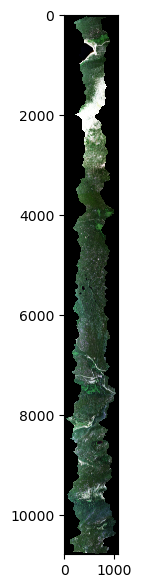

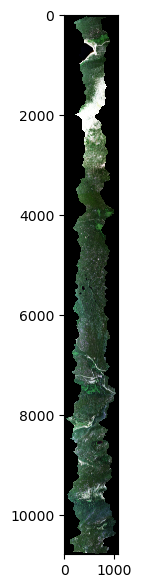

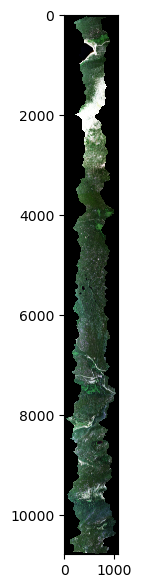

In [27]:
# Load caluclated coefficients
topo_coeffs = 'export/NEON_D13_NIWO_DP1_20200801_161441_reflectance_topo_coeffs__corrected_0.json'
envi.load_coeffs(topo_coeffs,'topo')

brdf_coeffs = 'export/NEON_D13_NIWO_DP1_20200801_161441_reflectance_brdf_coeffs__corrected_0.json'
envi.load_coeffs(brdf_coeffs,'brdf')

# Attach to original ENVI file
el_spectral.show_rgb(og_envi, correct = ['topo'])
el_spectral.show_rgb(og_envi, correct = ['brdf'])
el_spectral.show_rgb(og_envi, correct = ['topo','brdf'])


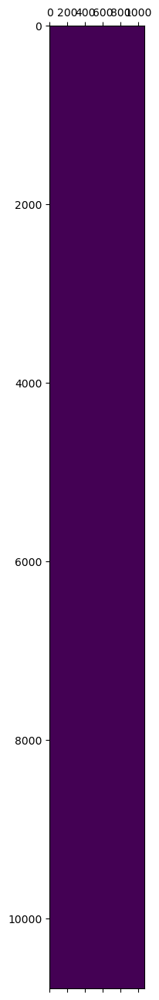

In [38]:
difference = og_envi.get_wave(2510.077393, corrections= []) - og_envi.get_wave(2510.077393, corrections= ['topo', 'brdf'])
plt.matshow(difference)





### Method 2 - use the converted ENVI files

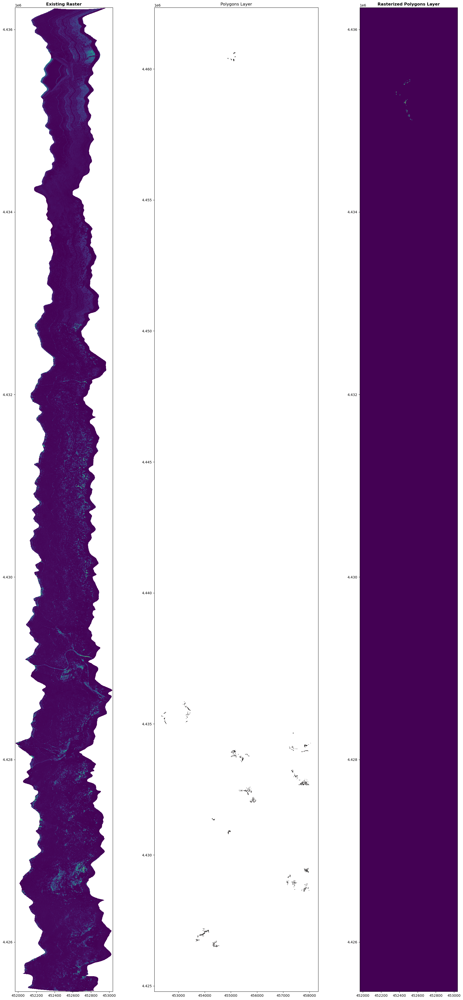

Rasterization complete. Output saved to export/NEON_D13_NIWO_DP1_20200801_161441_reflectance__corrected_0_RASTER.envi


In [47]:
gpkg_path = 'Datasets/niwot_aop_polygons_2023_12_8_23_analysis_ready_half_diam.gpkg'
existing_raster_path = "export/NEON_D13_NIWO_DP1_20200801_161441_reflectance__corrected_0"
output_raster_path = "export/NEON_D13_NIWO_DP1_20200801_161441_reflectance__corrected_0_RASTER.envi"

# Call the function with or without the `attribute` parameter
el_spectral.rasterize_polygons_to_match_envi(gpkg_path, existing_raster_path, output_raster_path, attribute='polygon_id')


## Extract spectra using overlapping polygons

In [48]:

output_raster_path = "export/NEON_D13_NIWO_DP1_20200801_161441_reflectance__corrected_0_RASTER.envi"

ENVI_path = "export/NEON_D13_NIWO_DP1_20200801_161441_reflectance__corrected_0"
gpkg_path = "Datasets/niwot_aop_polygons_2023_12_8_23_analysis_ready_half_diam.gpkg"
results_df = el_spectral.extract_overlapping_layers_to_2d_dataframe(ENVI_path, gpkg_path)
pd.DataFrame(results_df)

,polygon_id,layer_1,layer_2,layer_3,layer_4,layer_5,layer_6,layer_7,layer_8,layer_9,...,layer_417,layer_418,layer_419,layer_420,layer_421,layer_422,layer_423,layer_424,layer_425,layer_426
0,1100,403.700012,282.700012,257.299988,250.600006,223.169968,225.660767,238.688934,216.599609,215.224762,...,186.899994,157.899994,165.100006,111.300003,56.099998,61.700001,63.299999,116.400002,76.099998,117.599998
1,1101,515.909119,485.454559,381.818176,409.000000,368.439758,351.514008,372.982147,337.153320,339.073822,...,431.909088,413.636353,388.000000,278.181824,221.909088,200.454544,316.909088,319.181824,258.272736,260.090912
2,1103,1408.307739,1185.692261,971.000000,961.230774,877.211182,823.911438,870.551208,826.895813,816.662170,...,1446.769287,1344.769287,1365.538452,988.000000,893.692322,891.692322,1206.000000,1236.692261,1084.692261,1000.461548
3,1105,1380.444458,1024.222168,843.000000,821.777771,737.946228,695.910400,737.772705,697.987671,690.734070,...,1190.222168,1103.222168,1110.111084,850.666687,721.888916,748.222229,993.333313,989.000000,885.111084,807.666687
4,1107,985.133362,770.933350,609.400024,630.200012,581.091553,555.180603,576.406555,549.329102,549.221497,...,998.400024,925.400024,933.000000,698.666687,585.466675,541.466675,814.133362,769.200012,696.733337,620.466675
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,1207,582.964294,487.392853,388.821442,397.107147,347.603790,333.166565,342.815491,321.073547,317.654633,...,731.178589,686.035706,710.821411,558.285706,499.821442,507.428558,724.785706,664.500000,600.428589,599.607117
58,1208,373.071442,357.571442,273.928558,276.714294,250.245682,232.884140,246.783676,221.364120,219.482010,...,456.142853,419.928558,433.571442,312.142853,287.785706,282.642853,408.928558,385.285706,362.142853,350.571442
59,1209,416.083344,483.750000,406.416656,402.583344,353.978790,338.403076,352.410858,326.639435,328.818542,...,881.583313,842.333313,862.833313,689.916687,682.583313,681.833313,917.250000,827.250000,821.750000,759.333313
60,1210,562.304321,389.130432,338.434784,347.956512,313.746033,296.756012,307.940796,288.533325,282.619171,...,608.086975,553.826111,581.086975,436.043488,383.826080,342.391296,541.521729,515.652161,490.130432,454.260864


## Sample a square grid of pixels

In [54]:
filename="export/NEON_D13_NIWO_DP1_20200801_161441_reflectance__corrected_0"
#filename =  "export/resample_landsat5"

spectral_data, wavelengths = el_spectral.get_spectral_data_and_wavelengths(filename, 6, 1)
pd.DataFrame(spectral_data)


,0,1,2,3,4,5,6,7,8,9,...,1061,1062,1063,1064,1065,1066,1067,1068,1069,1070
0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
1,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
2,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
3,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
4,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
422,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
423,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0
424,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,...,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0


In [55]:
pd.DataFrame(wavelengths)

,0
0,381.666992
1,386.674988
2,391.683014
3,396.691101
4,401.699097
...,...
421,2490.045410
422,2495.053223
423,2500.061279
424,2505.069336


## Import all the ENVI files we've created

In [50]:
# Define your list of filenames
filenames = [
    "export/resample_landsat5.img",
    "export/resample_landsat7.img",
    "export/resample_landsat8.img",
    "export/resample_landsat9.img",
    "export/NEON_D13_NIWO_DP1_20200801_161441_reflectance__corrected_0",
    "output/NEON_D13_NIWO_DP1_20200801_161441_reflectance"
]

# Usage
spectra = el_spectral.load_spectra(filenames)
pd.DataFrame(spectra)

,export/resample_landsat5.img,export/resample_landsat7.img,export/resample_landsat8.img,export/resample_landsat9.img,export/NEON_D13_NIWO_DP1_20200801_161441_reflectance__corrected_0,output/NEON_D13_NIWO_DP1_20200801_161441_reflectance
spectral_data,"[[-9998.999997820287, -9998.999999999913, -999...","[[-9999.000000000004, -9999.0, -9999.0, -9999....","[[-9998.999999993026, -9999.0, -9999.0, -9999....","[[-9999.0, -9999.0, -9999.0, -9999.0, -9999.00...","[[-9999.0, -9999.0, -9999.0, -9999.0, -9999.0,...","[[-9999, -9999, -9999, -9999, -9999, -9999, -9..."
wavelengths,"[485.0, 560.0, 660.0, 830.0, 1650.0, 2215.0]","[477.0, 560.0, 662.0, 835.0, 1648.0, 2206.0]","[480.0, 560.0, 655.0, 865.0, 1610.0, 2200.0]","[453.0, 560.0, 655.0, 865.0, 1610.0, 2200.0]","[381.666992, 386.674988, 391.683014, 396.69110...","[381.666992, 386.674988, 391.683014, 396.69110..."


## Reshape spectral into standardized dataframe

In [58]:
sensor = 4  #0,1,2,3,4,5
reshaped_spectra = el_spectral.reshape_spectra(spectra, sensor)
reshaped_spectra

,sensor,band,wavelength_nm,reflectance,pixel,sensor_band
0,export/NEON_D13_NIWO_DP1_20200801_161441_refle...,0,381.666992,-9999.0,0,export/NEON_D13_NIWO_DP1_20200801_161441_refle...
1,export/NEON_D13_NIWO_DP1_20200801_161441_refle...,0,381.666992,-9999.0,1,export/NEON_D13_NIWO_DP1_20200801_161441_refle...
2,export/NEON_D13_NIWO_DP1_20200801_161441_refle...,0,381.666992,-9999.0,2,export/NEON_D13_NIWO_DP1_20200801_161441_refle...
3,export/NEON_D13_NIWO_DP1_20200801_161441_refle...,0,381.666992,-9999.0,3,export/NEON_D13_NIWO_DP1_20200801_161441_refle...
4,export/NEON_D13_NIWO_DP1_20200801_161441_refle...,0,381.666992,-9999.0,4,export/NEON_D13_NIWO_DP1_20200801_161441_refle...
...,...,...,...,...,...,...
456241,export/NEON_D13_NIWO_DP1_20200801_161441_refle...,425,2510.077393,-9999.0,1066,export/NEON_D13_NIWO_DP1_20200801_161441_refle...
456242,export/NEON_D13_NIWO_DP1_20200801_161441_refle...,425,2510.077393,-9999.0,1067,export/NEON_D13_NIWO_DP1_20200801_161441_refle...
456243,export/NEON_D13_NIWO_DP1_20200801_161441_refle...,425,2510.077393,-9999.0,1068,export/NEON_D13_NIWO_DP1_20200801_161441_refle...
456244,export/NEON_D13_NIWO_DP1_20200801_161441_refle...,425,2510.077393,-9999.0,1069,export/NEON_D13_NIWO_DP1_20200801_161441_refle...


## Join standardized dataframes into a single dataframe

In [61]:
sensors_range = range(6)  # Assuming sensors 0 to 5
concatenated_sensors = el_spectral.concatenate_sensors(el_spectral.reshape_spectra, spectra, sensors_range)
concatenated_sensors

,sensor,band,wavelength_nm,reflectance,pixel,sensor_band
0,landsat5,0,485.000000,-9998.999998,0,landsat5_0
1,landsat5,0,485.000000,-9998.999998,1,landsat5_0
2,landsat5,0,485.000000,-9998.999998,2,landsat5_0
3,landsat5,0,485.000000,-9998.999998,3,landsat5_0
4,landsat5,0,485.000000,-9998.999998,4,landsat5_0
...,...,...,...,...,...,...
938191,output/NEON_D13_NIWO_DP1_20200801_161441_refle...,425,2510.077393,-9999.000000,1066,output/NEON_D13_NIWO_DP1_20200801_161441_refle...
938192,output/NEON_D13_NIWO_DP1_20200801_161441_refle...,425,2510.077393,-9999.000000,1067,output/NEON_D13_NIWO_DP1_20200801_161441_refle...
938193,output/NEON_D13_NIWO_DP1_20200801_161441_refle...,425,2510.077393,-9999.000000,1068,output/NEON_D13_NIWO_DP1_20200801_161441_refle...
938194,output/NEON_D13_NIWO_DP1_20200801_161441_refle...,425,2510.077393,-9999.000000,1069,output/NEON_D13_NIWO_DP1_20200801_161441_refle...


## Plot corrected ENVI with a pixel highlighted

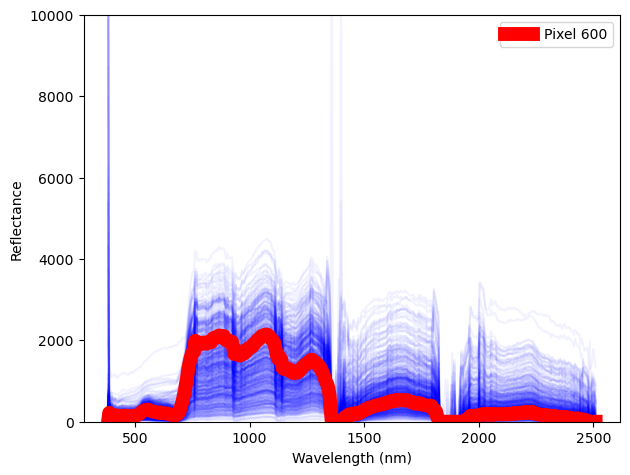

In [62]:
el_spectral.plot_spectral_data(reshaped_spectra, highlight_pixel=600)


## Plot a panel of all sensors, with the same pixel highlighted for contrast

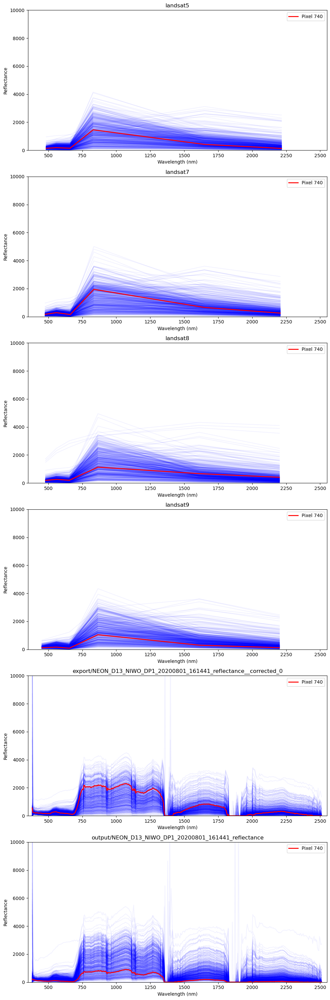

In [63]:
el_spectral.plot_each_sensor_with_highlight(concatenated_sensors , 740, 'figure_740_panel.pdf')

## Overlay the pixel from each sensor over hyperspectral background

In [66]:
#el_spectral.plot_with_highlighted_sensors( concatenated_sensors , 340, 'figure_340_single.pdf')





## Calculate Boosted Regression quantiles

## Load saved Boosted Regression table

In [70]:
concatenated_sensors_with_predictions = pd.read_csv('concatenated_sensors_with_predictions.csv')
pd.DataFrame(concatenated_sensors_with_predictions)


,sensor,band,wavelength_nm,reflectance,pixel,sensor_band,0.01,0.02,0.03,0.04,...,0.90,0.91,0.92,0.93,0.94,0.95,0.96,0.97,0.98,0.99
0,landsat5,0,485.000000,-9998.999998,0,landsat5_0,-9998.999998,-9998.999998,-9998.999998,-9998.999998,...,255.434767,269.894112,285.617545,305.623939,313.678152,341.437505,342.387118,419.691821,463.031158,584.094345
1,landsat5,0,485.000000,-9998.999998,1,landsat5_0,-9998.999998,-9998.999998,-9998.999998,-9998.999998,...,255.434767,269.894112,285.617545,305.623939,313.678152,341.437505,342.387118,419.691821,463.031158,584.094345
2,landsat5,0,485.000000,-9998.999998,2,landsat5_0,-9998.999998,-9998.999998,-9998.999998,-9998.999998,...,255.434767,269.894112,285.617545,305.623939,313.678152,341.437505,342.387118,419.691821,463.031158,584.094345
3,landsat5,0,485.000000,-9998.999998,3,landsat5_0,-9998.999998,-9998.999998,-9998.999998,-9998.999998,...,255.434767,269.894112,285.617545,305.623939,313.678152,341.437505,342.387118,419.691821,463.031158,584.094345
4,landsat5,0,485.000000,-9998.999998,4,landsat5_0,-9998.999998,-9998.999998,-9998.999998,-9998.999998,...,255.434767,269.894112,285.617545,305.623939,313.678152,341.437505,342.387118,419.691821,463.031158,584.094345
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938191,hyperspectral_original,425,2510.077393,-9999.000000,1066,hyperspectral_original_425,-9999.000000,-9999.000000,-9999.000000,-9999.000000,...,72.042782,79.272665,109.746172,117.160179,169.875142,195.758537,285.021168,275.123351,442.345045,580.900445
938192,hyperspectral_original,425,2510.077393,-9999.000000,1067,hyperspectral_original_425,-9999.000000,-9999.000000,-9999.000000,-9999.000000,...,72.042782,79.272665,109.746172,117.160179,169.875142,195.758537,285.021168,275.123351,442.345045,580.900445
938193,hyperspectral_original,425,2510.077393,-9999.000000,1068,hyperspectral_original_425,-9999.000000,-9999.000000,-9999.000000,-9999.000000,...,72.042782,79.272665,109.746172,117.160179,169.875142,195.758537,285.021168,275.123351,442.345045,580.900445
938194,hyperspectral_original,425,2510.077393,-9999.000000,1069,hyperspectral_original_425,-9999.000000,-9999.000000,-9999.000000,-9999.000000,...,72.042782,79.272665,109.746172,117.160179,169.875142,195.758537,285.021168,275.123351,442.345045,580.900445


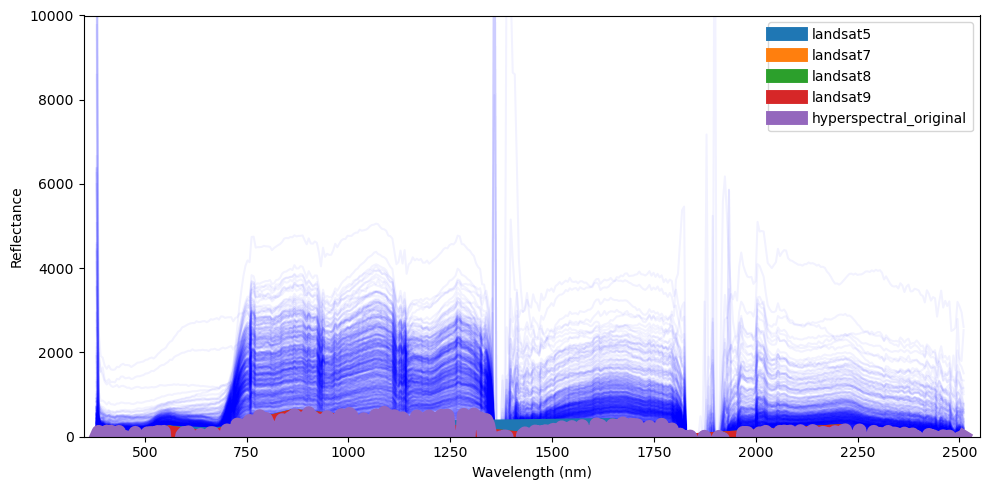

In [71]:

el_spectral.plot_with_highlighted_sensors( concatenated_sensors_with_predictions , 750, 'figure_340_single.pdf')



In [73]:
el_spectral.boosted_quantile_plot(concatenated_sensors_with_predictions, num_lines=10, title='Hyperspectral Corrected Predictions by Probability', save_path="probability_lines.pdf")


NameError: name 'concatenated_sensors' is not defined

<Figure size 1000x600 with 0 Axes>

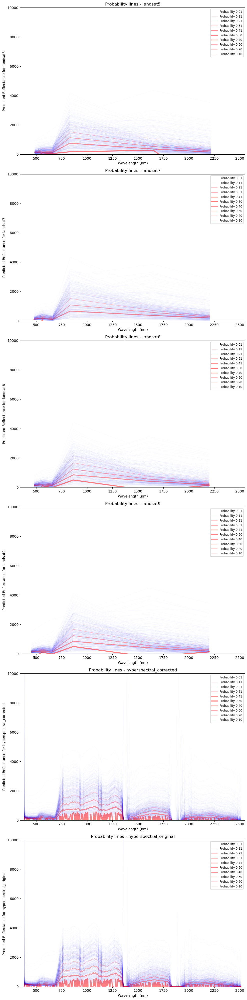

In [75]:
el_spectral.boosted_quantile_plot_by_sensor(concatenated_sensors_with_predictions, num_lines=10, title='Probability lines', save_path="probability_lines_by_sensor.pdf")
